# Swin-Transformer

## 0 前言

Swin Transformer是2021年微软研究院发表在ICCV上的一篇文章，并且已经获得`ICCV 2021 best paper`的荣誉称号。Swin Transformer网络是Transformer模型在视觉领域的又一次碰撞。

论文名称：Swin Transformer: Hierarchical Vision Transformer using Shifted Windows  
原论文地址： [https://arxiv.org/abs/2103.14030](https://arxiv.org/abs/2103.14030)  
官方开源代码地址：[https://github.com/microsoft/Swin-Transformer](https://github.com/microsoft/Swin-Transformer)

Pytorch实现代码： [pytorch\_classification/swin\_transformer](https://github.com/WZMIAOMIAO/deep-learning-for-image-processing/tree/master/pytorch_classification/swin_transformer)  
Tensorflow2实现代码：[tensorflow\_classification/swin\_transformer](https://github.com/WZMIAOMIAO/deep-learning-for-image-processing/tree/master/tensorflow_classification/swin_transformer)

不想看文章的可以看下我在bilibili上讲的视频： [https://www.bilibili.com/video/BV1pL4y1v7jC](https://www.bilibili.com/video/BV1pL4y1v7jC)

* * *

## 1 网络整体框架

在正文开始之前，先来简单对比下Swin Transformer和之前的Vision Transformer（如果不了解Vision Transformer的建议先去看下我[之前的文章](https://blog.csdn.net/qq_37541097/article/details/118242600)）。下图是Swin Transformer文章中给出的图1，左边是本文要讲的Swin Transformer，右边边是之前讲的Vision Transformer。通过对比至少可以看出两点不同：

+   Swin Transformer使用了类似卷积神经网络中的层次化构建方法（Hierarchical feature maps），比如特征图尺寸中有对图像下采样4倍的，8倍的以及16倍的，这样的backbone有助于在此基础上构建目标检测，实例分割等任务。而在之前的Vision Transformer中是一开始就直接下采样16倍，后面的特征图也是维持这个下采样率不变。
+   在Swin Transformer中使用了Windows Multi-Head Self-Attention(W-MSA)的概念，比如在下图的4倍下采样和8倍下采样中，将特征图划分成了多个不相交的区域（Window），并且Multi-Head Self-Attention只在每个窗口（Window）内进行。相对于Vision Transformer中直接对整个（Global）特征图进行Multi-Head Self-Attention，这样做的目的是能够减少计算量的，尤其是在浅层特征图很大的时候。这样做虽然减少了计算量但也会隔绝不同窗口之间的信息传递，所以在论文中作者又提出了 Shifted Windows Multi-Head Self-Attention(SW-MSA)的概念，通过此方法能够让信息在相邻的窗口中进行传递，后面会细讲。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/4835528644ffcb483732678807ab00b6.png#pic_center)

接下来，简单看下原论文中给出的关于Swin Transformer（Swin-T）网络的架构图。通过图(a)可以看出整个框架的基本流程如下：

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/acf0cb17eb71e9efdef4420d56da706d.png#pic_center)

+   首先将图片输入到Patch Partition模块中进行分块，即每4x4相邻的像素为一个Patch，然后在channel方向展平（flatten）。假设输入的是RGB三通道图片，那么每个patch就有4x4=16个像素，然后每个像素有R、G、B三个值所以展平后是16x3=48，所以通过Patch Partition后图像shape由 `[H, W, 3]`变成了 `[H/4, W/4, 48]`。然后在通过Linear Embeding层对每个像素的channel数据做线性变换，由48变成C，即图像shape再由 `[H/4, W/4, 48]`变成了 `[H/4, W/4, C]`。其实在源码中Patch Partition和Linear Embeding就是直接通过一个卷积层实现的，和之前Vision Transformer中讲的 Embedding层结构一模一样。
    
+   然后就是通过四个Stage构建不同大小的特征图，除了Stage1中先通过一个Linear Embeding层外，剩下三个stage都是先通过一个Patch Merging层进行下采样（后面会细讲）。然后都是重复堆叠Swin Transformer Block注意这里的Block其实有两种结构，如图(b)中所示，这两种结构的不同之处仅在于一个使用了W-MSA结构，一个使用了SW-MSA结构。而且这两个结构是成对使用的，先使用一个W-MSA结构再使用一个SW-MSA结构。所以你会发现堆叠Swin Transformer Block的次数都是偶数（因为成对使用）。
    
+   最后对于分类网络，后面还会接上一个Layer Norm层、全局池化层以及全连接层得到最终输出。图中没有画，但源码中是这样做的。
    

接下来，在分别对`Patch Merging`、`W-MSA`、`SW-MSA`以及使用到的相对位置偏执（relative position bias）进行详解。关于Swin Transformer Block中的`MLP`结构和Vision Transformer中的结构是一样的，所以这里也不在赘述，[参考](https://blog.csdn.net/qq_37541097/article/details/118242600#t5)。

* * *

## 2 Patch Merging详解

前面有说，在每个Stage中首先要通过一个Patch Merging层进行下采样（Stage1除外）。如下图所示，假设输入Patch Merging的是一个4x4大小的单通道特征图（feature map），Patch Merging会将每个2x2的相邻像素划分为一个patch，然后将每个patch中相同位置（同一颜色）像素给拼在一起就得到了4个feature map。接着将这四个feature map在深度方向进行concat拼接，然后在通过一个LayerNorm层。最后通过一个全连接层在feature map的深度方向做线性变化，将feature map的深度由C变成C/2。通过这个简单的例子可以看出，通过Patch Merging层后，feature map的高和宽会减半，深度会翻倍。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/efbb5f6cd0929e870c0acb8b7dfcf425.png#pic_center)

* * *

## 3 W-MSA详解

引入Windows Multi-head Self-Attention（W-MSA）模块是为了减少计算量。如下图所示，左侧使用的是普通的Multi-head Self-Attention（MSA）模块，对于feature map中的每个像素（或称作token，patch）在Self-Attention计算过程中需要和所有的像素去计算。但在图右侧，在使用Windows Multi-head Self-Attention（W-MSA）模块时，首先将feature map按照MxM（例子中的M=2）大小划分成一个个Windows，然后单独对每个Windows内部进行Self-Attention。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/08dfc09f92ff3766608490fcbcd355b2.png#pic_center)  
两者的计算量具体差多少呢？原论文中有给出下面两个公式，这里忽略了Softmax的计算复杂度。：  
Ω ( M S A ) = 4 h w C 2 + 2 ( h w ) 2 C                 ( 1 ) Ω ( W − M S A ) = 4 h w C 2 + 2 M 2 h w C       ( 2 ) \\Omega (MSA)=4hwC^2 + 2{(hw)}^2C \\ \\ \\ \\ \\ \\ \\ \\ \\ \\ \\ \\ \\ \\ \\ (1) \\\\ \\Omega (W-MSA)=4hwC^2 + 2M^2hwC\\ \\ \\ \\ \\ (2) Ω(MSA)\=4hwC2+2(hw)2C               (1)Ω(W−MSA)\=4hwC2+2M2hwC     (2)

+   h代表feature map的高度
+   w代表feature map的宽度
+   C代表feature map的深度
+   M代表每个窗口（Windows）的大小

这个公式是咋来的，原论文中并没有细讲，这里简单说下。首先回忆下单头Self-Attention的公式，如果对Self-Attention不了解的，请看下我之前写的[文章](https://blog.csdn.net/qq_37541097/article/details/117691873)。  
A t t e n t i o n ( Q , K , V ) = S o f t M a x ( Q K T d ) V Attention(Q, K, V)={\\rm SoftMax}(\\frac{QK^T}{\\sqrt d})V Attention(Q,K,V)\=SoftMax(d ​QKT​)V

### MSA模块计算量

对于feature map中的每个像素（或称作token，patch），都要通过 W q , W k , W v W\_q, W\_k, W\_v Wq​,Wk​,Wv​生成对应的query(q)，key(k)以及value(v)。这里假设q, k, v的向量长度与feature map的深度C保持一致。那么对应所有像素生成Q的过程如下式：  
A h w × C ⋅ W q C × C = Q h w × C A^{hw \\times C} \\cdot W^{C \\times C}\_q=Q^{hw \\times C} Ahw×C⋅WqC×C​\=Qhw×C

+   A h w × C A^{hw \\times C} Ahw×C为将所有像素（token）拼接在一起得到的矩阵（一共有hw个像素，每个像素的深度为C）
+   W q C × C W^{C \\times C}\_q WqC×C​为生成query的变换矩阵
+   Q h w × C Q^{hw \\times C} Qhw×C为所有像素通过 W q C × C W^{C \\times C}\_q WqC×C​得到的query拼接后的矩阵

根据矩阵运算的计算量公式可以得到生成Q的计算量为 h w × C × C hw \\times C \\times C hw×C×C，生成K和V同理都是 h w C 2 hwC^2 hwC2，那么总共是 3 h w C 2 3hwC^2 3hwC2。接下来 Q Q Q和 K T K^T KT相乘，对应计算量为 ( h w ) 2 C (hw)^2C (hw)2C：  
Q h w × C ⋅ K T ( C × h w ) = X h w × h w Q^{hw \\times C} \\cdot K^{T(C \\times hw)}= X^{hw \\times hw} Qhw×C⋅KT(C×hw)\=Xhw×hw  
接下来忽略除以 d \\sqrt d d ​以及softmax的计算量，假设得到 Λ h w × h w \\Lambda ^{hw \\times hw} Λhw×hw，最后还要乘以V，对应的计算量为 ( h w ) 2 C (hw)^2C (hw)2C:  
Λ h w × h w ⋅ V h w × C = B h w × C \\Lambda ^{hw \\times hw} \\cdot V^{hw \\times C}=B^{hw \\times C} Λhw×hw⋅Vhw×C\=Bhw×C  
那么对应单头的Self-Attention模块，总共需要 3 h w C 2 + ( h w ) 2 C + ( h w ) 2 C = 3 h w C 2 + 2 ( h w ) 2 C 3hwC^2 + (hw)^2C + (hw)^2C=3hwC^2 + 2(hw)^2C 3hwC2+(hw)2C+(hw)2C\=3hwC2+2(hw)2C。而在实际使用过程中，使用的是多头的Multi-head Self-Attention模块，在之前的文章中有进行过实验对比，多头注意力模块相比单头注意力模块的计算量仅多了最后一个融合矩阵 W O W\_O WO​的计算量 h w C 2 hwC^2 hwC2。  
B h w × C ⋅ W O C × C = O h w × C B^{hw \\times C} \\cdot W\_O^{C \\times C} = O^{hw \\times C} Bhw×C⋅WOC×C​\=Ohw×C  
所以总共加起来是： 4 h w C 2 + 2 ( h w ) 2 C 4hwC^2 + 2(hw)^2C 4hwC2+2(hw)2C

### W-MSA模块计算量

对于W-MSA模块首先要将feature map划分到一个个窗口（Windows）中，假设每个窗口的宽高都是M，那么总共会得到 h M × w M \\frac {h} {M} \\times \\frac {w} {M} Mh​×Mw​个窗口，然后对每个窗口内使用多头注意力模块。刚刚计算高为h，宽为w，深度为C的feature map的计算量为 4 h w C 2 + 2 ( h w ) 2 C 4hwC^2 + 2(hw)^2C 4hwC2+2(hw)2C，这里每个窗口的高为M宽为M，带入公式得：  
4 ( M C ) 2 + 2 ( M ) 4 C 4(MC)^2 + 2(M)^4C 4(MC)2+2(M)4C  
又因为有 h M × w M \\frac {h} {M} \\times \\frac {w} {M} Mh​×Mw​个窗口，则：  
h M × w M × ( 4 ( M C ) 2 + 2 ( M ) 4 C ) = 4 h w C 2 + 2 M 2 h w C \\frac {h} {M} \\times \\frac {w} {M} \\times (4(MC)^2 + 2(M)^4C)=4hwC^2 + 2M^2 hwC Mh​×Mw​×(4(MC)2+2(M)4C)\=4hwC2+2M2hwC  
故使用W-MSA模块的计算量为： 4 h w C 2 + 2 M 2 h w C 4hwC^2 + 2M^2 hwC 4hwC2+2M2hwC

假设feature map的h、w都为112，M=7，C=128，采用W-MSA模块相比MSA模块能够节省约40124743680 FLOPs：  
2 ( h w ) 2 C − 2 M 2 h w C = 2 × 11 2 4 × 128 − 2 × 7 2 × 11 2 2 × 128 = 40124743680 2(hw)^2C-2M^2 hwC=2 \\times 112^4 \\times 128 - 2 \\times 7^2 \\times 112^2 \\times 128=40124743680 2(hw)2C−2M2hwC\=2×1124×128−2×72×1122×128\=40124743680

* * *

## 4 SW-MSA详解

前面有说，采用W-MSA模块时，只会在每个窗口内进行自注意力计算，所以窗口与窗口之间是无法进行信息传递的。为了解决这个问题，作者引入了Shifted Windows Multi-Head Self-Attention（SW-MSA）模块，即进行偏移的W-MSA。如下图所示，左侧使用的是刚刚讲的W-MSA（假设是第L层），那么根据之前介绍的W-MSA和SW-MSA是成对使用的，那么第L+1层使用的就是SW-MSA（右侧图）。根据左右两幅图对比能够发现窗口（Windows）发生了偏移（可以理解成窗口从左上角分别向右侧和下方各偏移了 ⌊ M 2 ⌋ \\left \\lfloor \\frac {M} {2} \\right \\rfloor ⌊2M​⌋个像素）。看下偏移后的窗口（右侧图），比如对于第一行第2列的2x4的窗口，它能够使第L层的第一排的两个窗口信息进行交流。再比如，第二行第二列的4x4的窗口，他能够使第L层的四个窗口信息进行交流，其他的同理。那么这就解决了不同窗口之间无法进行信息交流的问题。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/05a8fc43e0f99856f885fd489388136b.png#pic_center)  
根据上图，可以发现通过将窗口进行偏移后，由原来的4个窗口变成9个窗口了。后面又要对每个窗口内部进行MSA，这样做感觉又变麻烦了。为了解决这个麻烦，作者又提出而了`Efficient batch computation for shifted configuration`，一种更加高效的计算方法。下面是原论文给的示意图。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/469861c2f8fd0c46f8e511184f0bb059.png#pic_center)  
感觉不太好描述，然后我自己又重新画了个。下图左侧是刚刚通过偏移窗口后得到的新窗口，右侧是为了方便大家理解，对每个窗口加上了一个标识。然后0对应的窗口标记为区域A，3和6对应的窗口标记为区域B，1和2对应的窗口标记为区域C。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/9d2f12f80a604d4fd5b21b4c513fa3f7.png#pic_center)  
然后先将区域A和C移到最下方。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/21afd361bc0d19a97b221482d4e6bfd7.png#pic_center)  
接着，再将区域A和B移至最右侧。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/02a8778cf503b4051c1b059aa202b814.png#pic_center)  
移动完后，4是一个单独的窗口；将5和3合并成一个窗口；7和1合并成一个窗口；8、6、2和0合并成一个窗口。这样又和原来一样是4个4x4的窗口了，所以能够保证计算量是一样的。这里肯定有人会想，把不同的区域合并在一起（比如5和3）进行MSA，这信息不就乱窜了吗？是的，为了防止这个问题，在实际计算中使用的是`masked MSA`即带蒙板mask的MSA，这样就能够通过设置蒙板来隔绝不同区域的信息了。关于mask如何使用，可以看下下面这幅图，下图是以上面的区域5和区域3为例。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/be2e21ca1c32c703649740fcef453a9e.png#pic_center)  
对于该窗口内的每一个像素（或称token，patch）在进行MSA计算时，都要先生成对应的query(q)，key(k)，value(v)。假设对于上图的像素0而言，得到 q 0 q^0 q0后要与每一个像素的k进行匹配（match），假设 α 0 , 0 \\alpha \_{0,0} α0,0​代表 q 0 q^0 q0与像素0对应的 k 0 k^0 k0进行匹配的结果，那么同理可以得到 α 0 , 0 \\alpha \_{0,0} α0,0​至 α 0 , 15 \\alpha \_{0,15} α0,15​。按照普通的MSA计算，接下来就是SoftMax操作了。但对于这里的`masked MSA`，像素0是属于区域5的，我们只想让它和区域5内的像素进行匹配。那么我们可以将像素0与区域3中的所有像素匹配结果都减去100（例如 α 0 , 2 , α 0 , 3 , α 0 , 6 , α 0 , 7 \\alpha \_{0,2}, \\alpha \_{0,3}, \\alpha \_{0,6}, \\alpha \_{0,7} α0,2​,α0,3​,α0,6​,α0,7​等等），由于 α \\alpha α的值都很小，一般都是零点几的数，将其中一些数减去100后在通过SoftMax得到对应的权重都等于0了。所以对于像素0而言实际上还是只和区域5内的像素进行了MSA。那么对于其他像素也是同理，具体代码是怎么实现的，后面会在代码讲解中进行详解。**注意，在计算完后还要把数据给挪回到原来的位置上（例如上述的A，B，C区域）。**

* * *

## 5 Relative Position Bias详解

关于相对位置偏执，论文里也没有细讲，就说了参考的哪些论文，然后说使用了相对位置偏执后给够带来明显的提升。根据原论文中的表4可以看出，在Imagenet数据集上如果不使用任何位置偏执，`top-1`为80.1，但使用了相对位置偏执（`rel. pos.`）后`top-1`为83.3，提升还是很明显的。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/f80fce14d2f029a300e48268aff008fe.png#pic_center)  
那这个相对位置偏执是加在哪的呢，根据论文中提供的公式可知是在Q和K进行匹配并除以 d \\sqrt d d ​后加上了相对位置偏执B。  
A t t e n t i o n ( Q , K , V ) = S o f t M a x ( Q K T d + B ) V Attention(Q, K, V)=SoftMax(\\frac {QK^T} {\\sqrt d} + B)V Attention(Q,K,V)\=SoftMax(d ​QKT​+B)V

由于论文中并没有详解讲解这个相对位置偏执，所以我自己根据阅读源码做了简单的总结。如下图，假设输入的feature map高宽都为2，那么首先我们可以构建出每个像素的绝对位置（左下方的矩阵），对于每个像素的绝对位置是使用行号和列号表示的。比如蓝色的像素对应的是第0行第0列所以绝对位置索引是 ( 0 , 0 ) (0,0) (0,0)，接下来再看看相对位置索引。首先看下蓝色的像素，在蓝色像素使用q与所有像素k进行匹配过程中，是以蓝色像素为参考点。然后用蓝色像素的绝对位置索引与其他位置索引进行相减，就得到其他位置相对蓝色像素的**相对位置索引**。例如黄色像素的绝对位置索引是 ( 0 , 1 ) (0,1) (0,1)，则它相对蓝色像素的相对位置索引为 ( 0 , 0 ) − ( 0 , 1 ) = ( 0 , − 1 ) (0, 0) - (0, 1)=(0, -1) (0,0)−(0,1)\=(0,−1)，这里是严格按照源码中来讲的，请不要杠。那么同理可以得到其他位置相对蓝色像素的相对位置索引矩阵。同样，也能得到相对黄色，红色以及绿色像素的相对位置索引矩阵。接下来将每个相对位置索引矩阵按行展平，并拼接在一起可以得到下面的4x4矩阵 。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/31ee595e488b669effcff607cc948bec.png#pic_center)  
请注意，我这里描述的一直是**相对位置索引**，并不是**相对位置偏执参数**。因为后面我们会根据相对位置索引去取对应的参数。比如说黄色像素是在蓝色像素的右边，所以相对蓝色像素的相对位置索引为 ( 0 , − 1 ) (0, -1) (0,−1)。绿色像素是在红色像素的右边，所以相对红色像素的相对位置索引为 ( 0 , − 1 ) (0, -1) (0,−1)。可以发现这两者的相对位置索引都是 ( 0 , − 1 ) (0, -1) (0,−1)，所以他们使用的**相对位置偏执参数**都是一样的。其实讲到这基本已经讲完了，但在源码中作者为了方便把二维索引给转成了一维索引。具体这么转的呢，有人肯定想到，简单啊直接把行、列索引相加不就变一维了吗？比如上面的相对位置索引中有 ( 0 , − 1 ) (0, -1) (0,−1)和 ( − 1 , 0 ) (-1,0) (−1,0)在二维的相对位置索引中明显是代表不同的位置，但如果简单相加都等于-1那不就出问题了吗？接下来我们看看源码中是怎么做的。首先在原始的相对位置索引上加上M-1(M为窗口的大小，在本示例中M=2)，加上之后索引中就不会有负数了。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/f4126ce18e14cc63fbb65231387456ed.png#pic_center)  
接着将所有的行标都乘上2M-1。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/70f2925523e8b4b7f5d57ac1129546d9.png#pic_center)  
最后将行标和列标进行相加。这样即保证了相对位置关系，而且不会出现上述 0 + ( − 1 ) = ( − 1 ) + 0 0+(-1)=(-1)+0 0+(−1)\=(−1)+0的问题了，是不是很神奇。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/93e94d7318cf4db486ab56bf19a1d9cc.png#pic_center)  
刚刚上面也说了，之前计算的是**相对位置索引**，并不是**相对位置偏执参数**。真正使用到的可训练参数 B ^ \\hat{B} B^是保存在`relative position bias table`表里的，这个表的长度是等于 ( 2 M − 1 ) × ( 2 M − 1 ) (2M-1) \\times (2M-1) (2M−1)×(2M−1)的。那么上述公式中的相对位置偏执参数B是根据上面的相对位置索引表根据查`relative position bias table`表得到的，如下图所示。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/e3fae73bcd7510f186e893b6e55bc78b.png#pic_center)

* * *

## 6 模型详细配置参数

首先回忆下Swin Transformer的网络架构：

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/acf0cb17eb71e9efdef4420d56da706d.png#pic_center)

下图（表7）是原论文中给出的关于不同Swin Transformer的配置，T(Tiny)，S(Small)，B(Base)，L(Large)，其中：

+   `win. sz. 7x7`表示使用的窗口（Windows）的大小
+   `dim`表示feature map的channel深度（或者说token的向量长度）
+   `head`表示多头注意力模块中head的个数

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/0b565e9f0fabfa3a4a15025417796feb.png#pic_center)

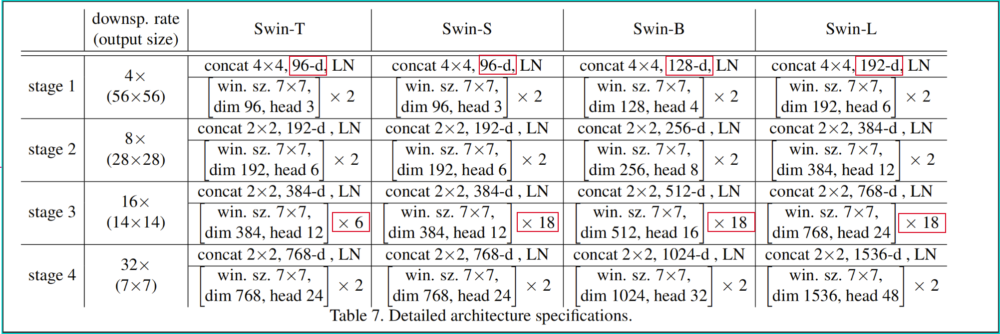

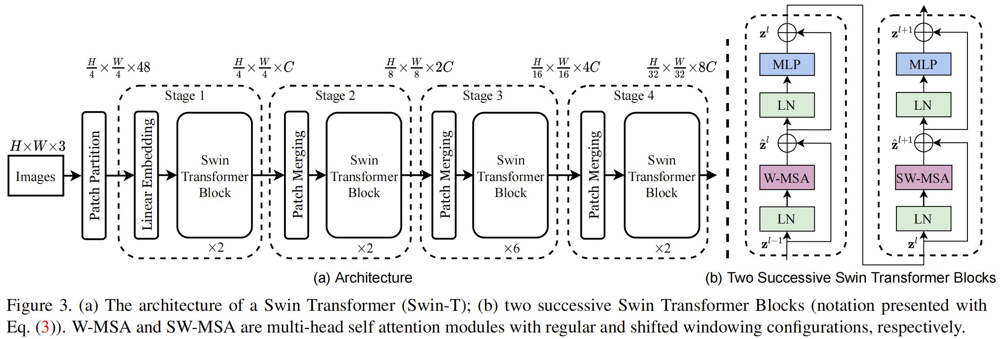

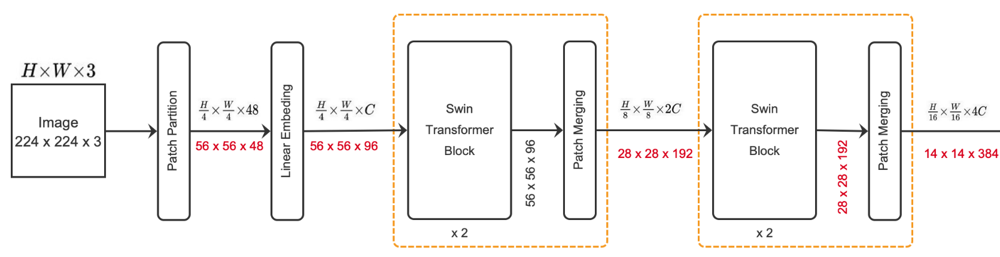

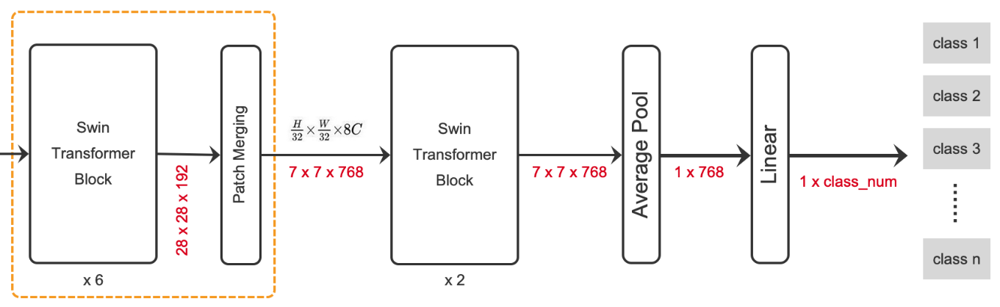

### CNN

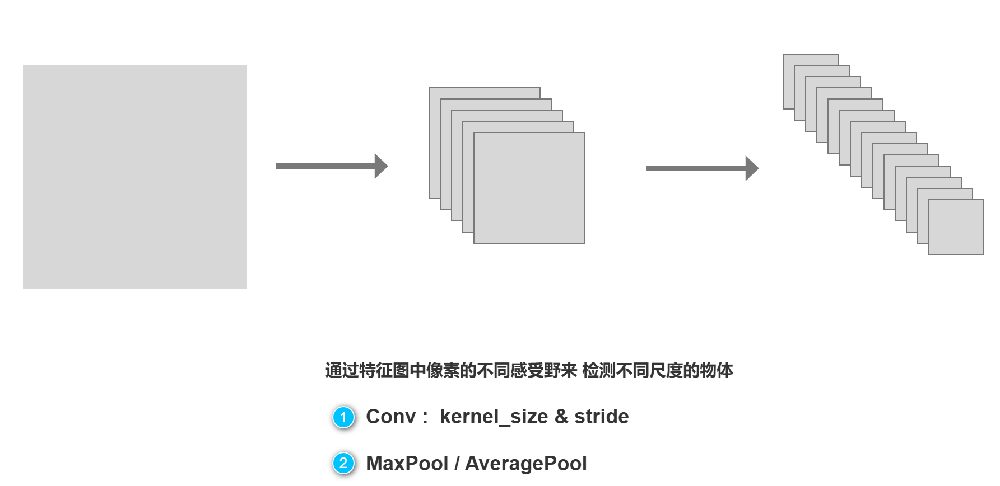

#### MSA: multi-head self-attention

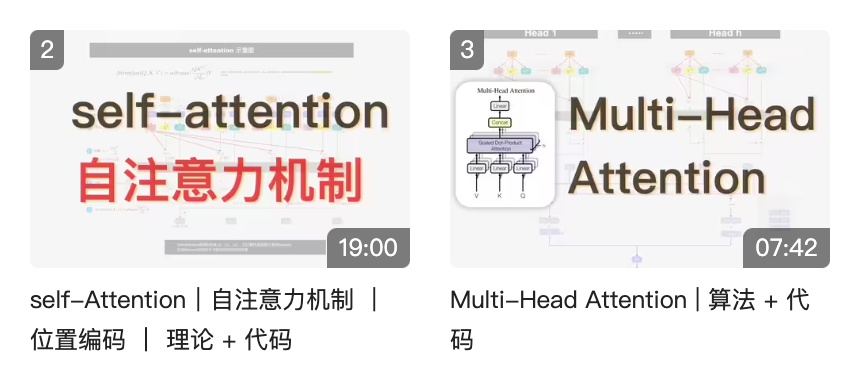

### W-MSA ： windows - multi-head self-attention

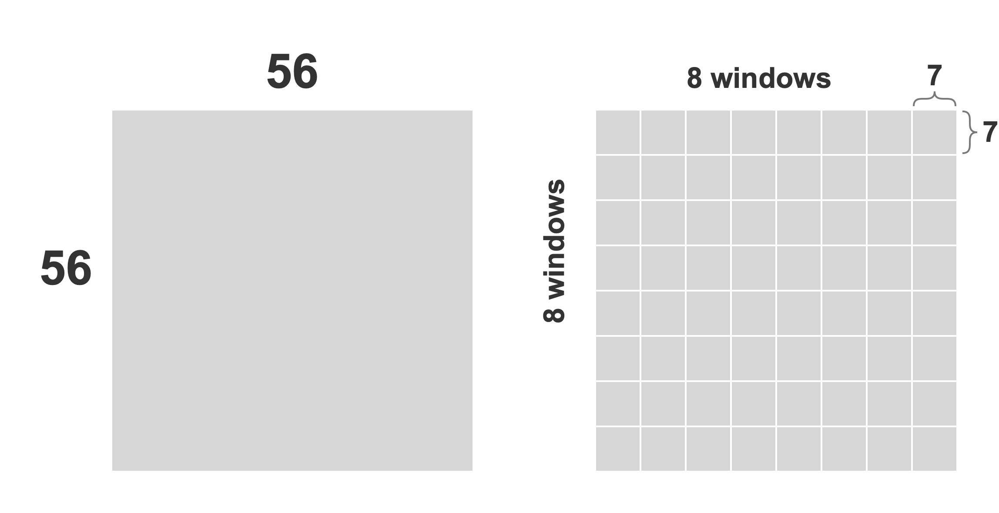

### SW-MSA ： shifted windows - multi-head self-attention

分割grid 向右下角 移动  window size // 2


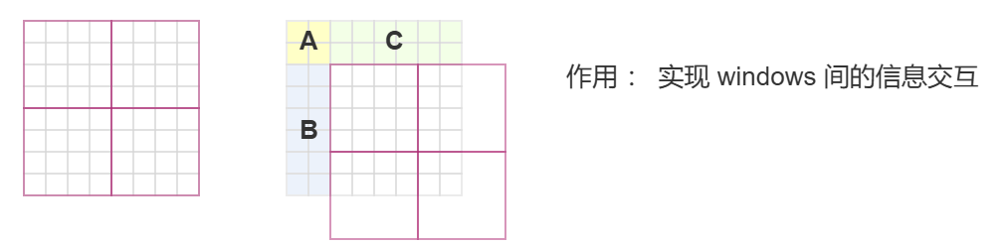

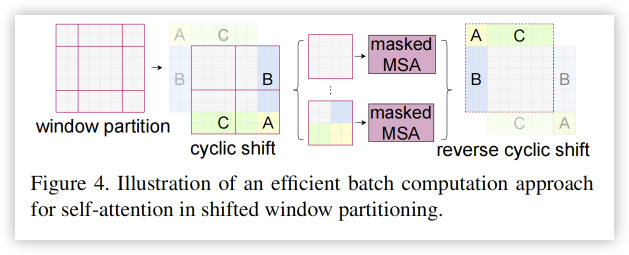

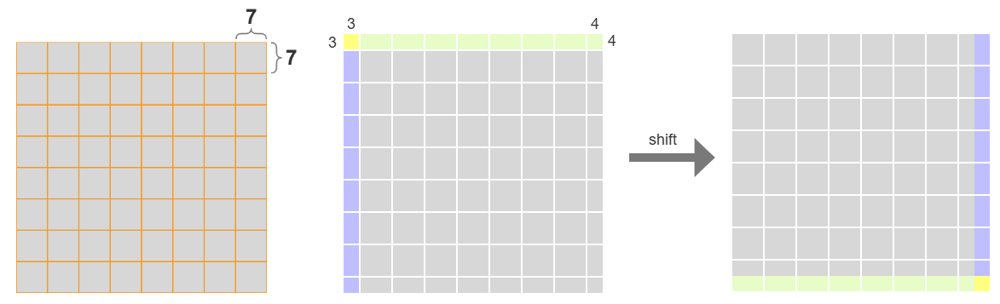

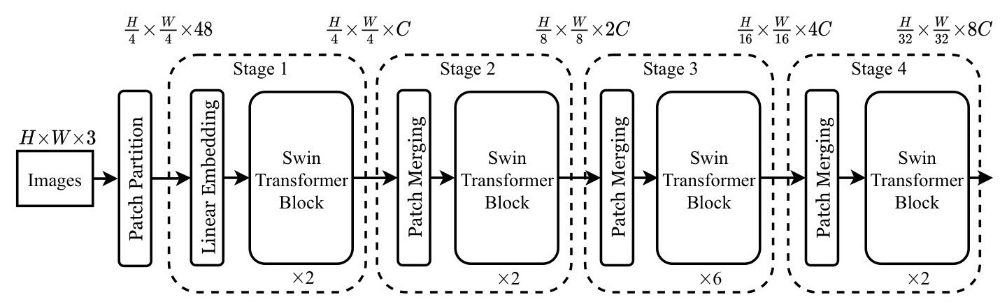



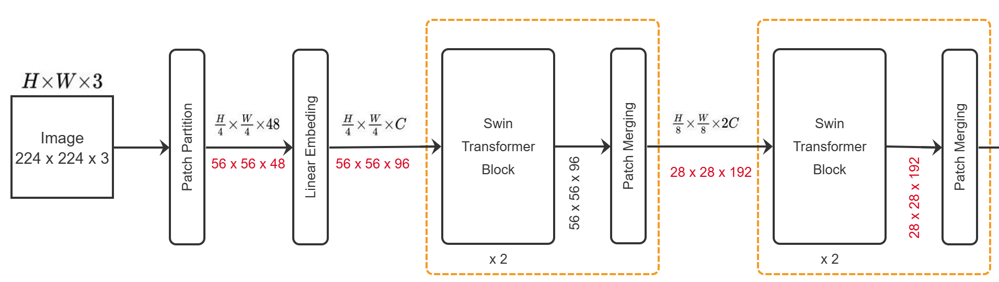

...

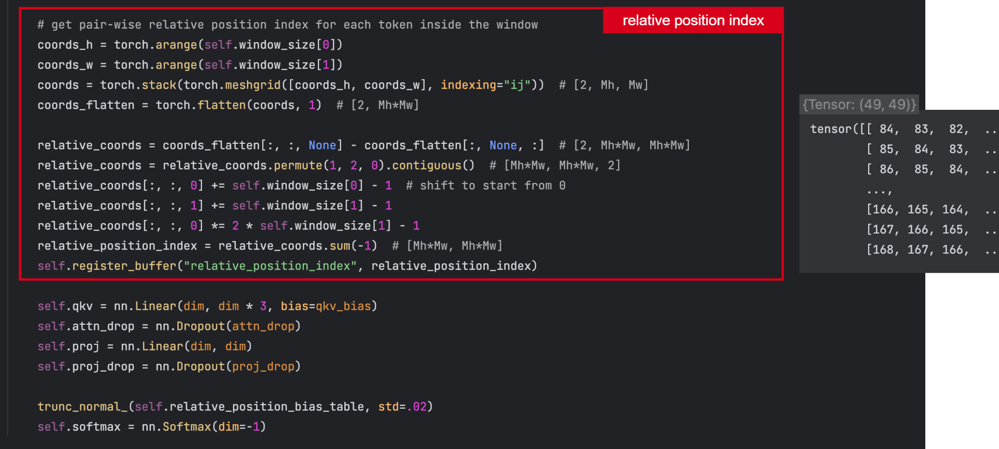

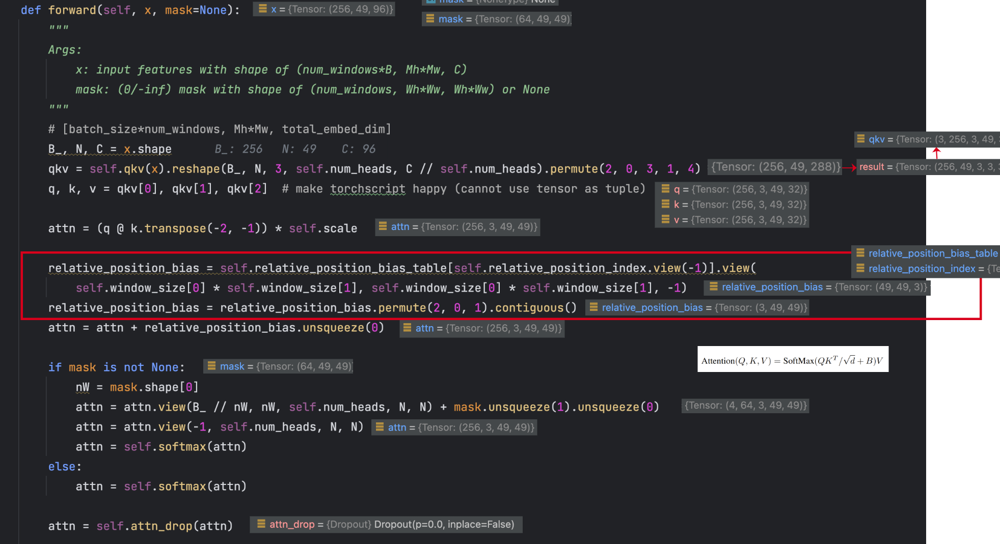

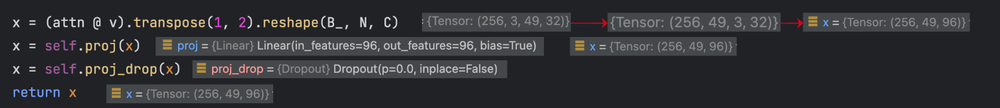


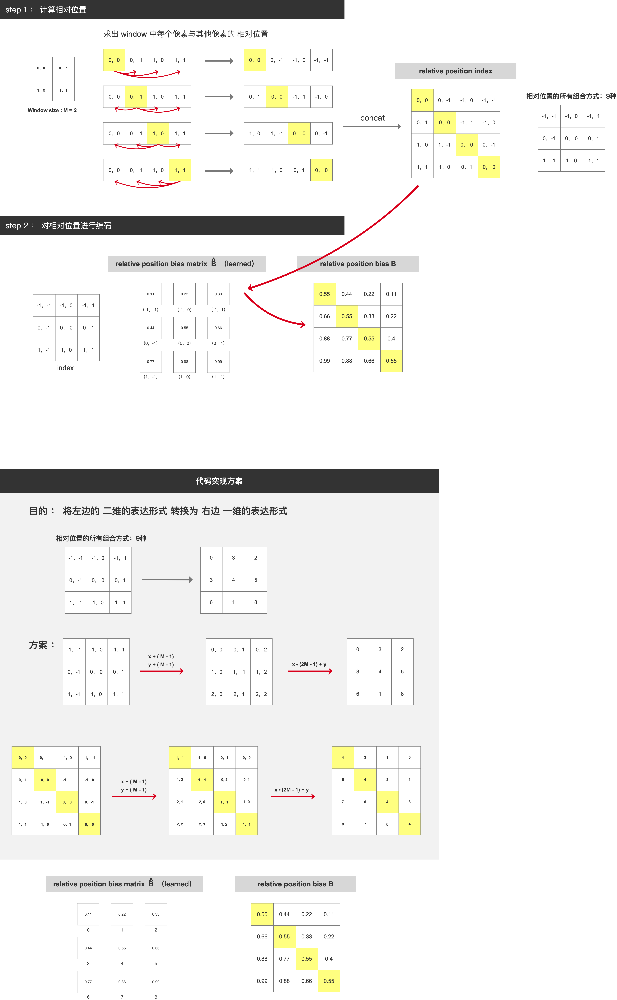

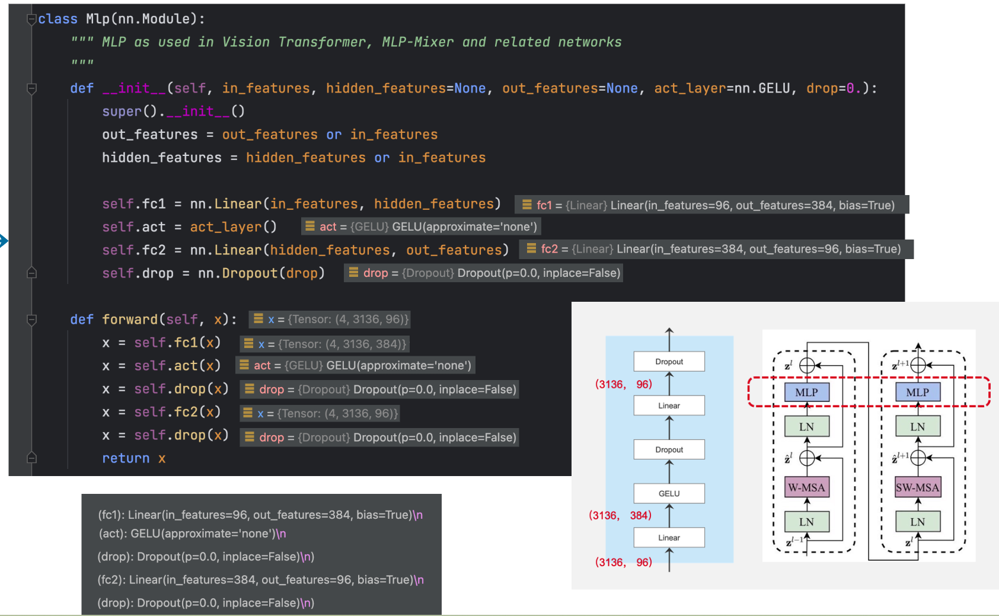